# Lib

In [4]:
import os
import pickle

import numpy as np
import matplotlib.pyplot as plt

from scipy.signal import butter, filtfilt, welch

import neurokit2 as nk

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import classification_report

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss

from sklearn.ensemble import BaggingClassifier


# Analyze ECG

## 📌 ECG Data Loading, Label Processing, and Visualization

In this step, we define the list of patient files and create a function to analyze ECG signals for stress detection.

---


#### **1. Patient Files Definition**
We first specify the paths of multiple `.pkl` files, where each file contains ECG data and stress labels for one patient.

#### **2. Data Loading**
Inside the `analyze_ecg` function:
- ECG data are loaded using `pickle`
- The ECG signal is extracted from the **chest channel**
- The signal is flattened to ensure it is a **1D signal**

#### **3. Label Conversion**
Original labels are converted into a **binary format**:

- `0` → no stress  
- `1` → stress  

This simplification is useful for **stress vs. no-stress analysis**.

#### **4. ECG Segmentation by Class**
The ECG signal is split into two parts:
- ECG samples **without stress**
- ECG samples **with stress**

This allows a direct comparison between the two conditions.

#### **5. Basic Statistics**
For each patient, the number of samples in both classes is printed to:
- Inspect the data distribution
- Check class balance

#### **6. Signal Visualization**
Three different plots can be generated:
- The **full raw ECG signal**
- The **ECG signal with stress samples highlighted**
- The **ECG signal plotted against time (seconds)** using the sampling frequency

#### **7. Function Output**
The function returns:
- The full ECG signal
- The binary stress labels
- ECG samples without stress
- ECG samples with stress

#### **8. Batch Processing**
Finally, the function is applied to all patient files to perform the same analysis **consistently across subjects**.


In [5]:
patient_files = [
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S2.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S3.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S4.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S5.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S6.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S7.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S8.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S9.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S10.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S11.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S13.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S14.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S15.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S16.pkl",
    "C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S17.pkl"
]

Patient: S2.pkl
Samples No Stress: 3824800
Samples Stress: 430500


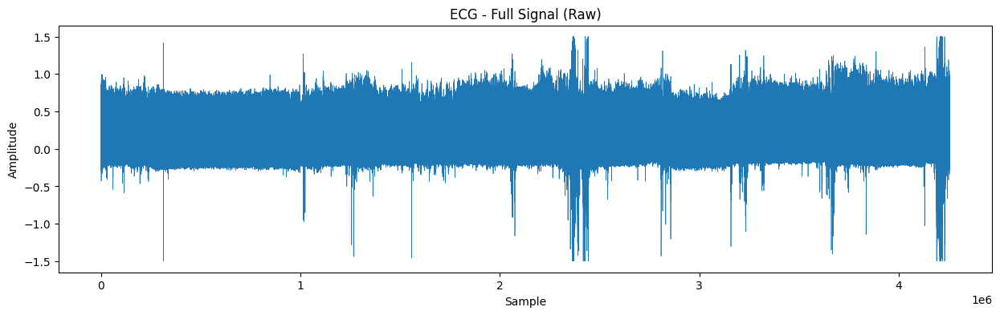

C:\Users\fccat\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


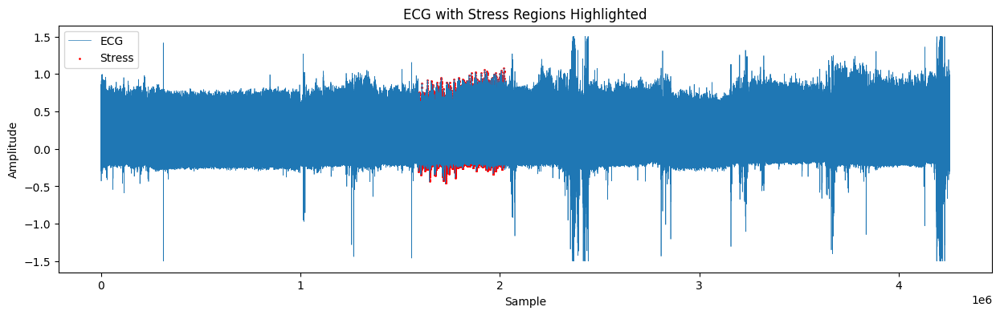

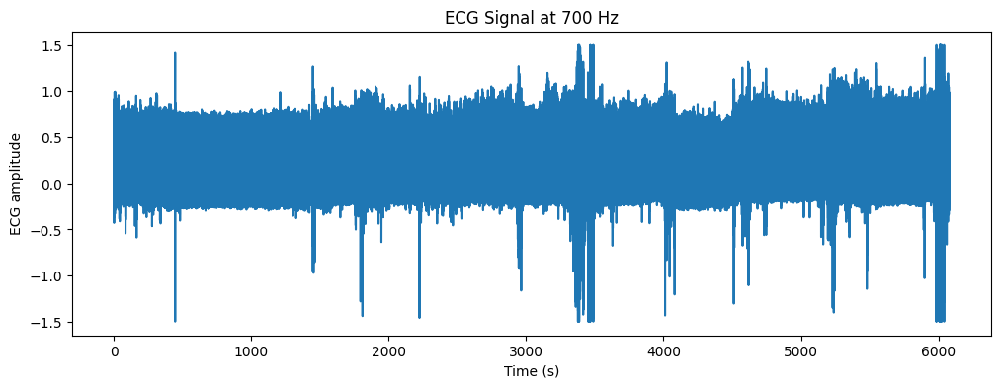

Patient: S3.pkl
Samples No Stress: 4097100
Samples Stress: 448000


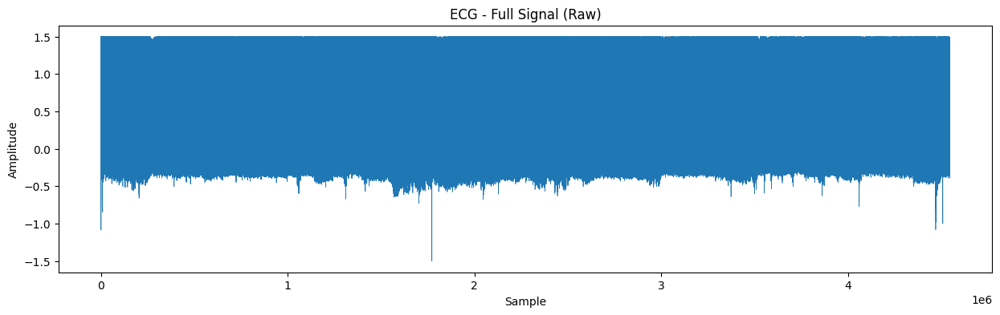

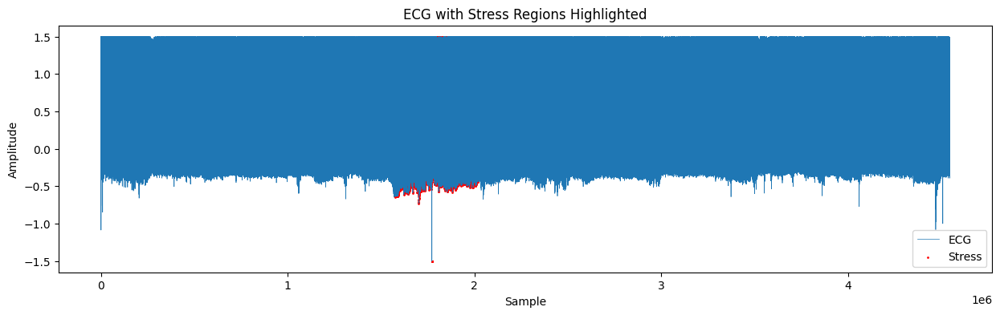

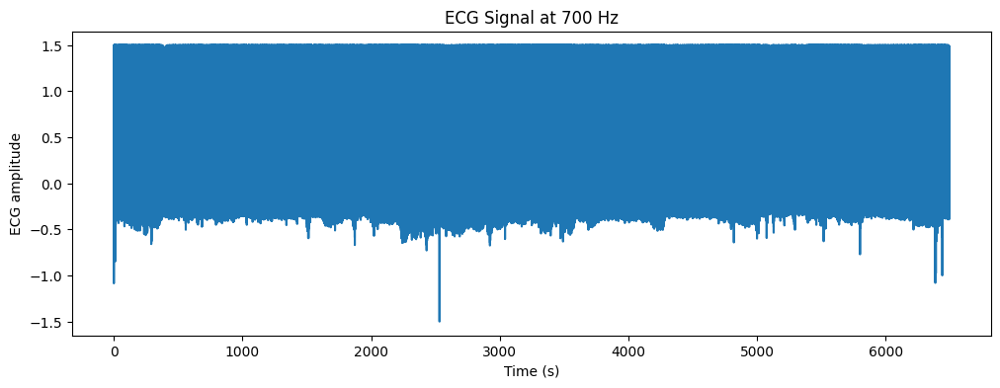

Patient: S4.pkl
Samples No Stress: 4051600
Samples Stress: 444500


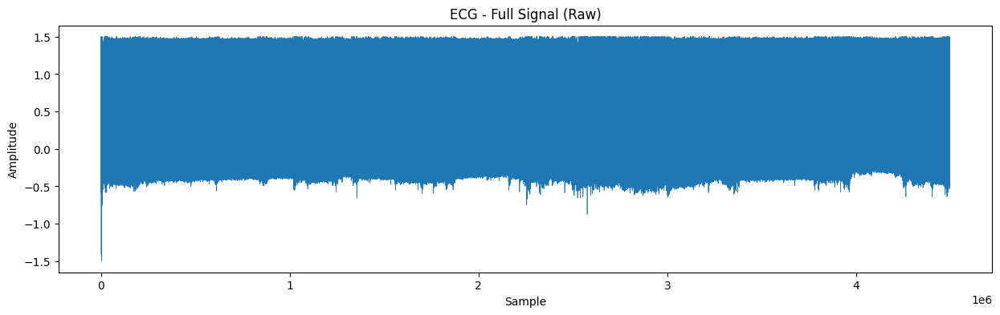

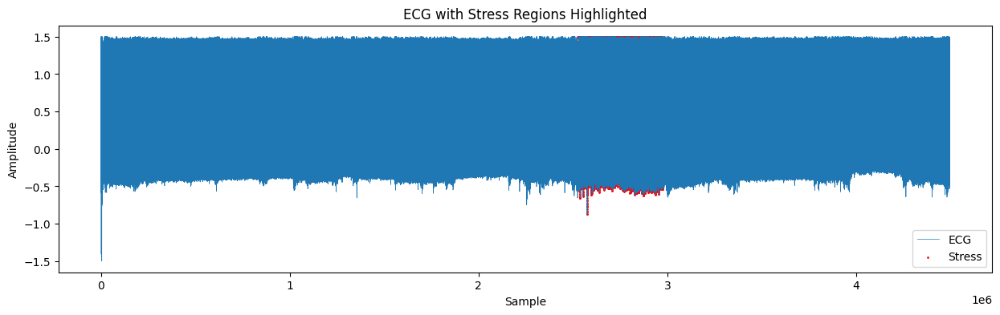

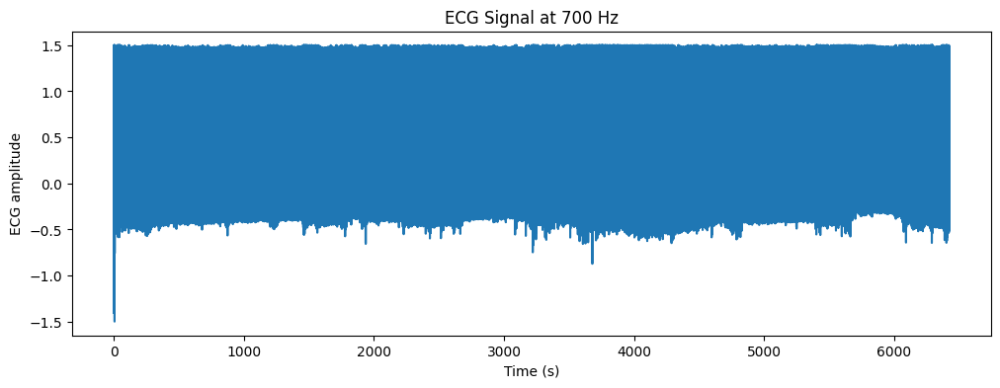

Patient: S5.pkl
Samples No Stress: 3929100
Samples Stress: 451500


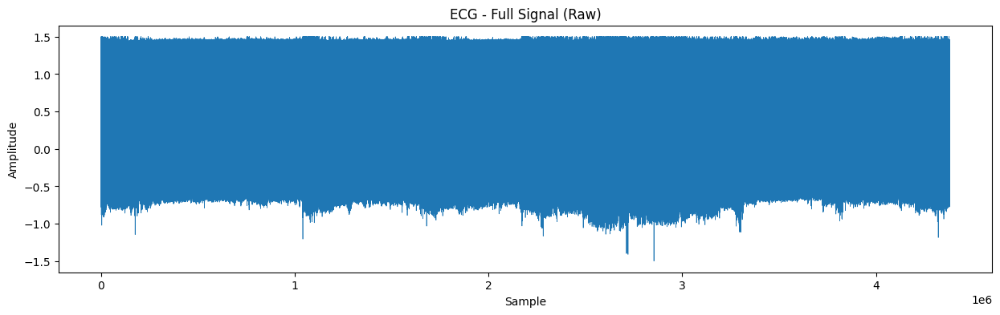

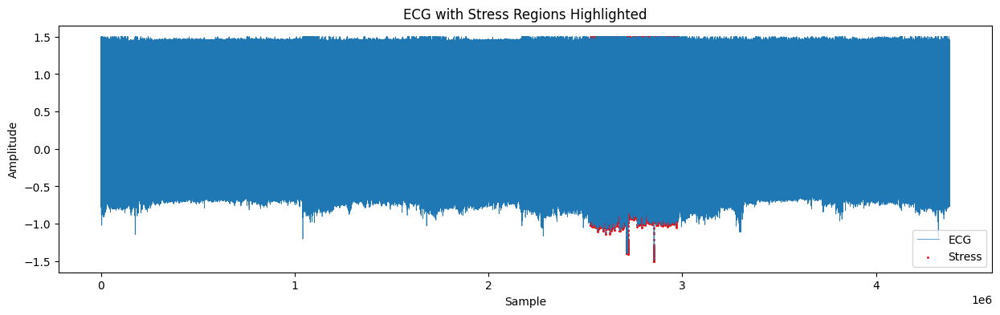

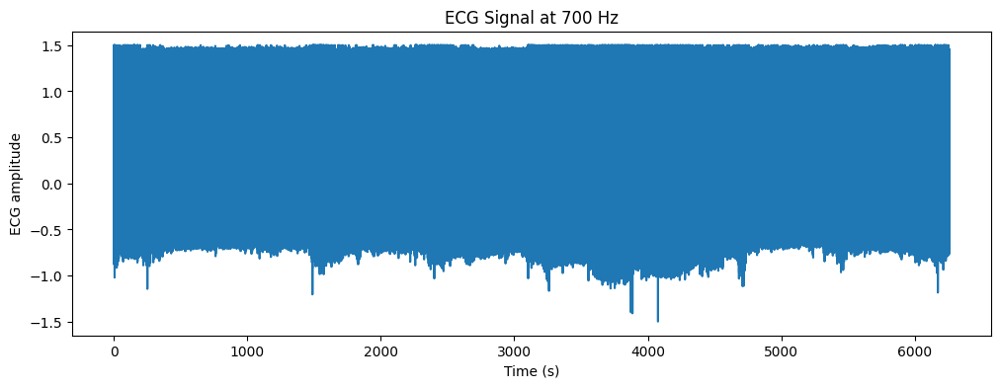

Patient: S6.pkl
Samples No Stress: 4494700
Samples Stress: 455000


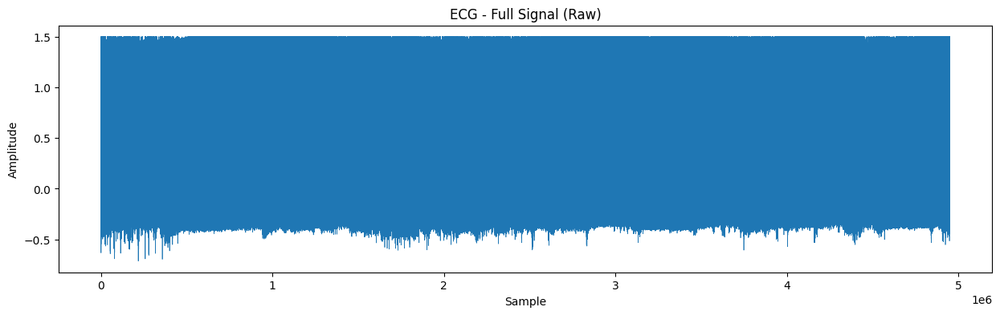

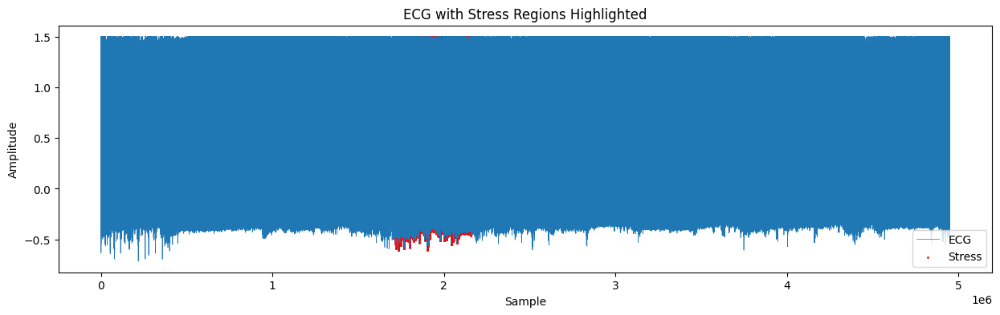

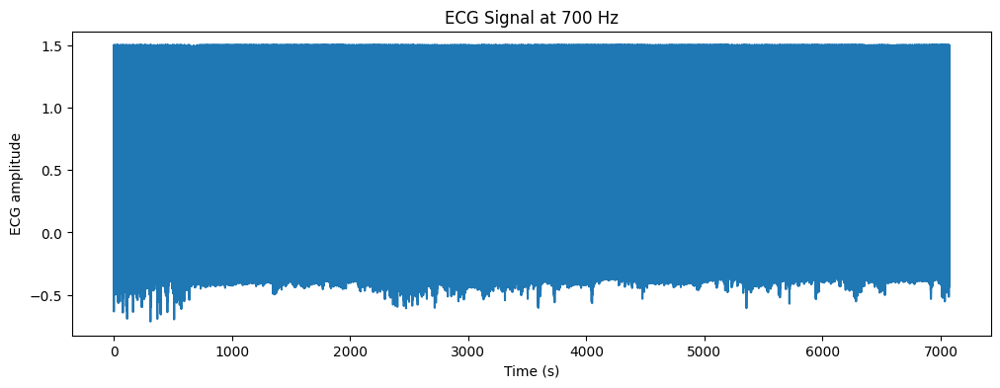

Patient: S7.pkl
Samples No Stress: 3218600
Samples Stress: 448000


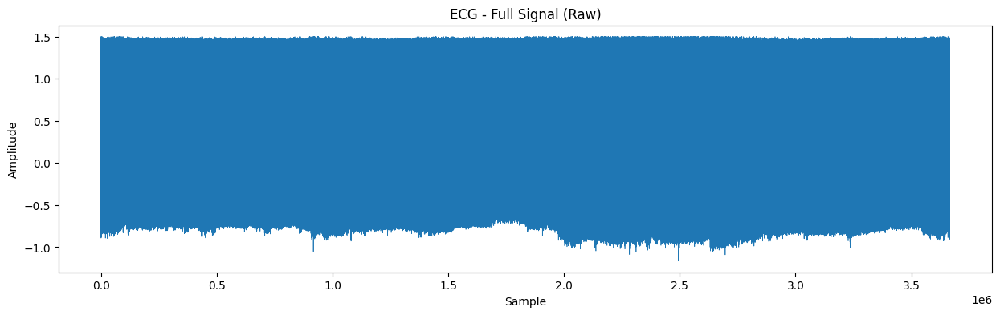

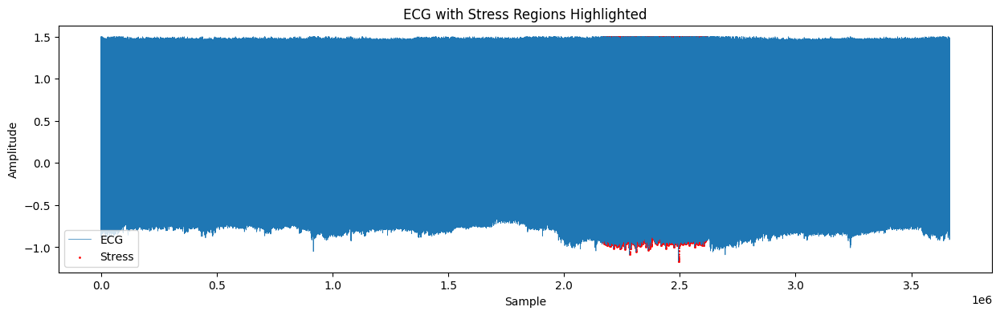

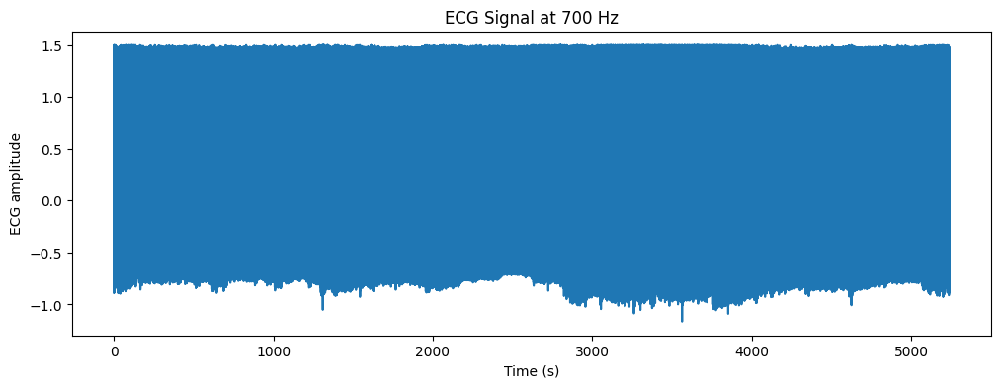

Patient: S8.pkl
Samples No Stress: 3357200
Samples Stress: 469000


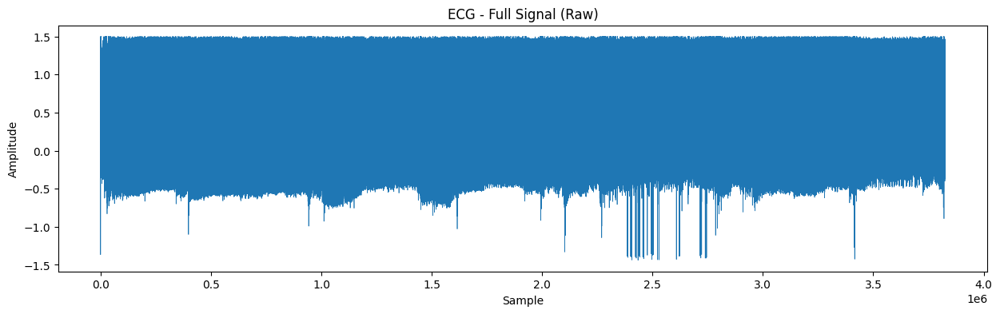

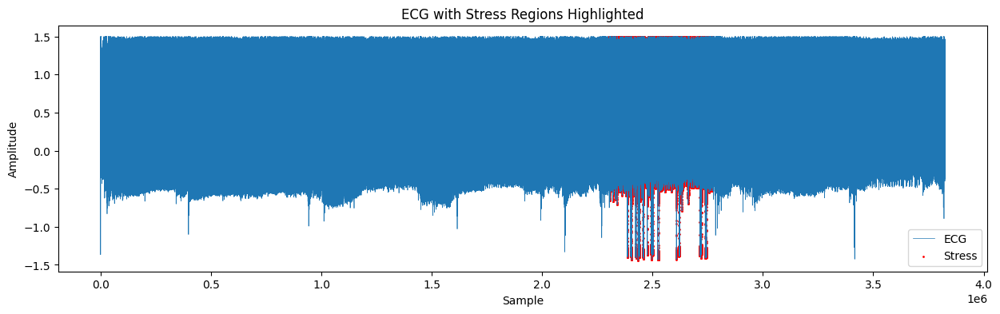

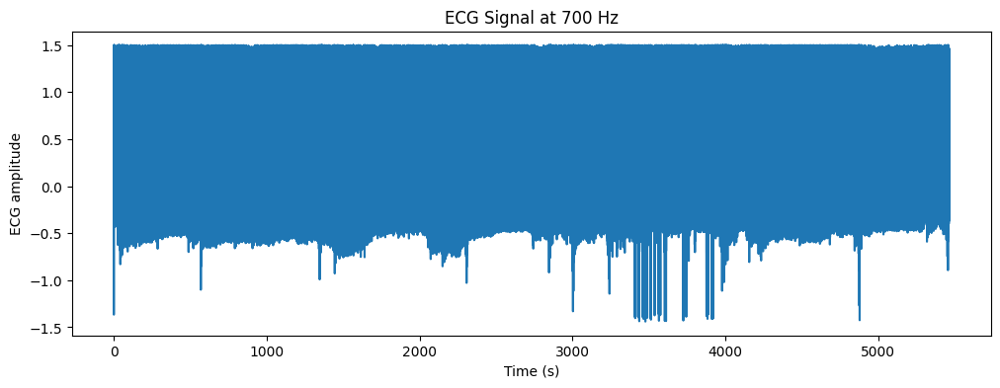

Patient: S9.pkl
Samples No Stress: 3204600
Samples Stress: 451500


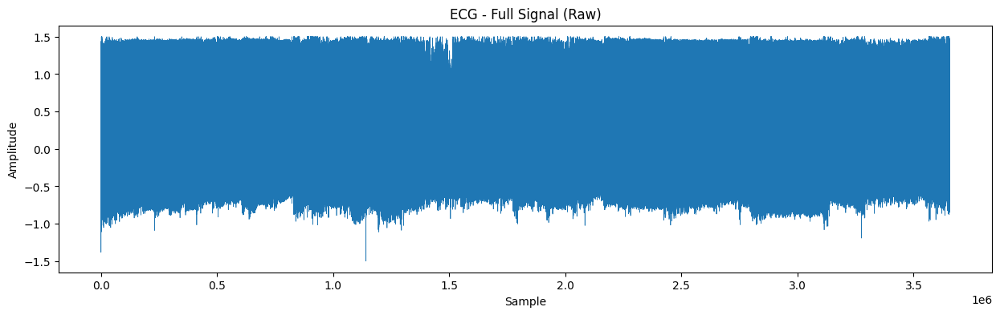

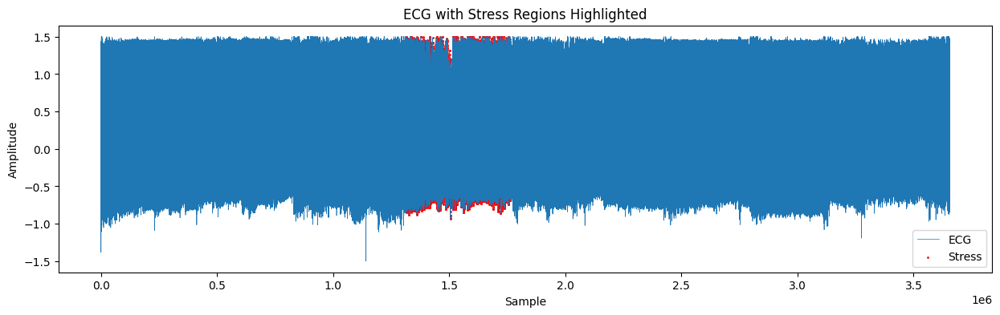

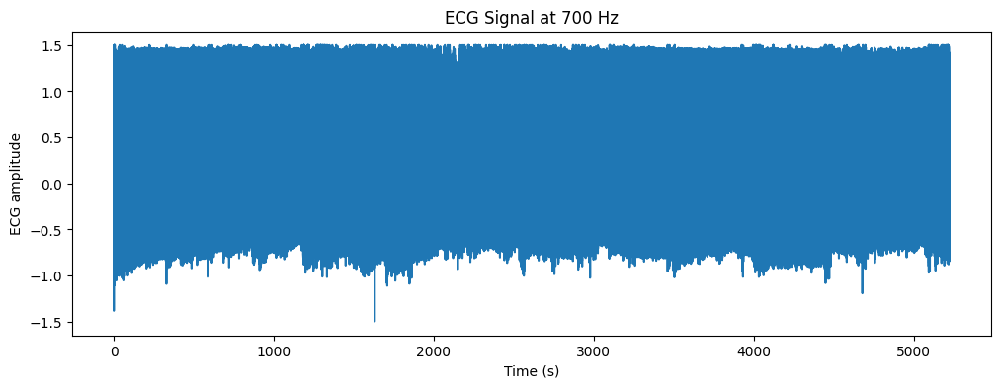

Patient: S10.pkl
Samples No Stress: 3339700
Samples Stress: 507500


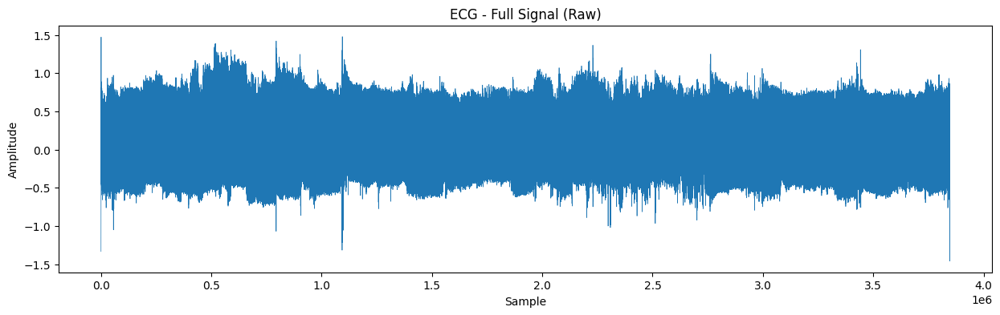

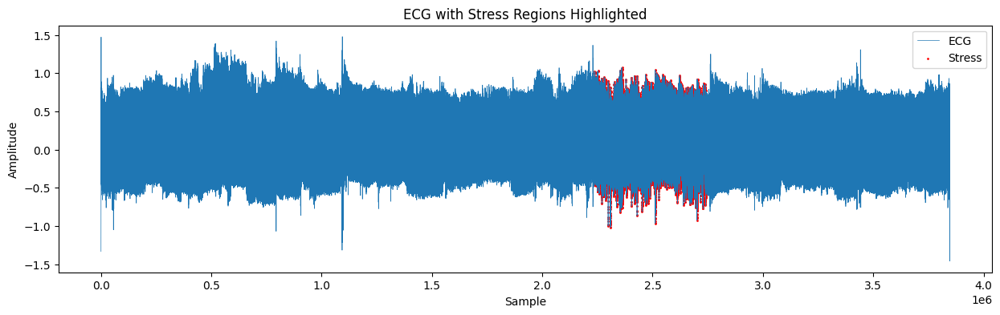

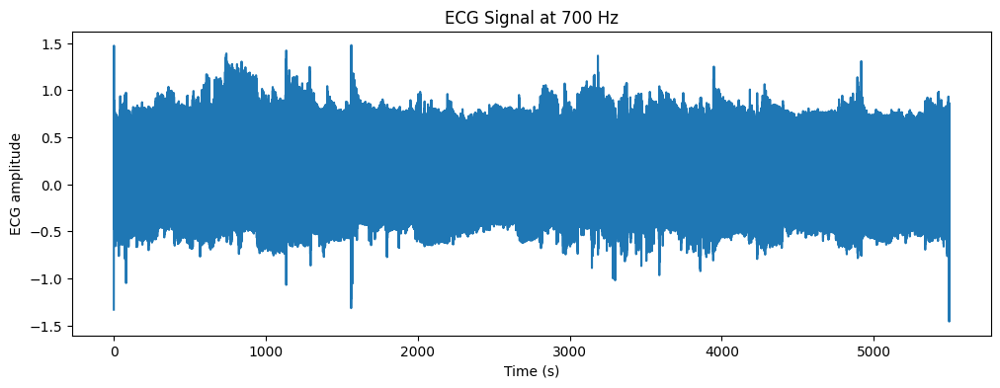

Patient: S11.pkl
Samples No Stress: 3187100
Samples Stress: 476000


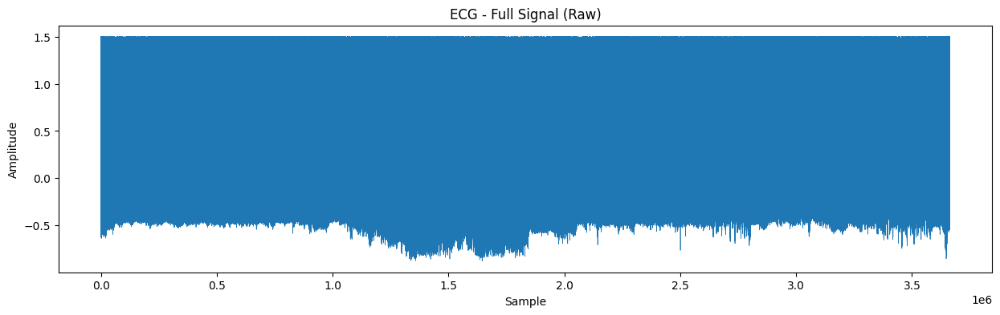

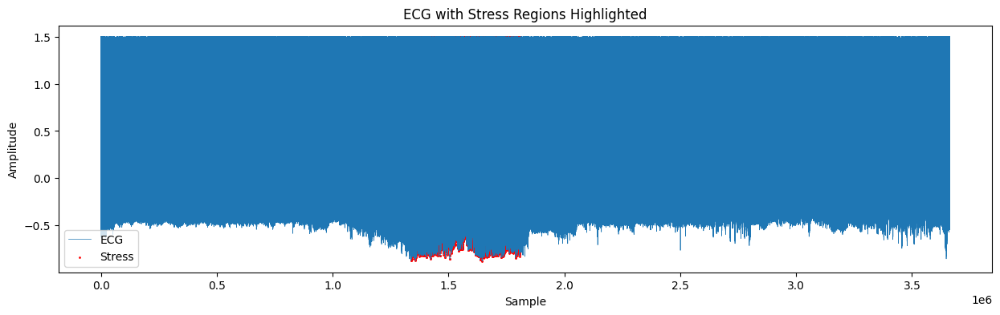

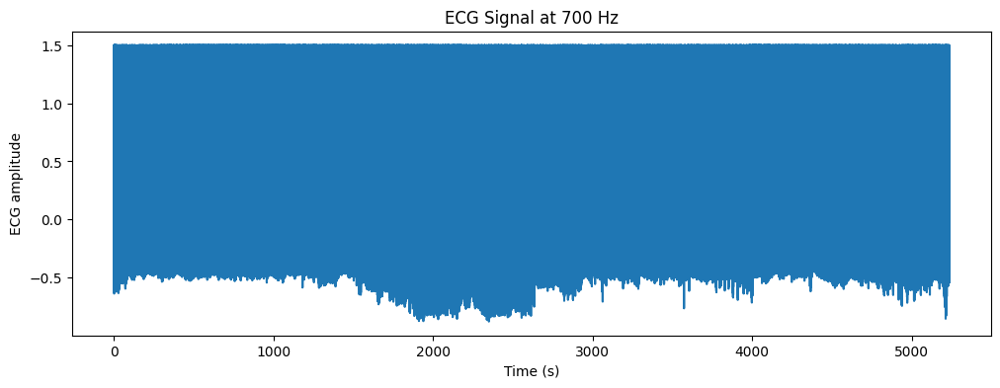

Patient: S13.pkl
Samples No Stress: 3411100
Samples Stress: 464800


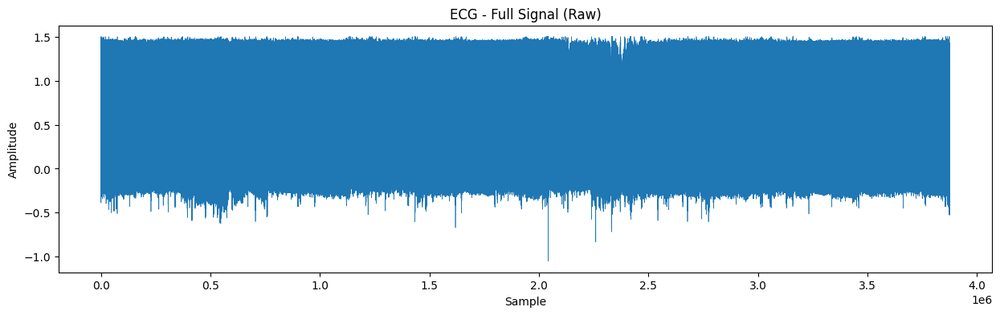

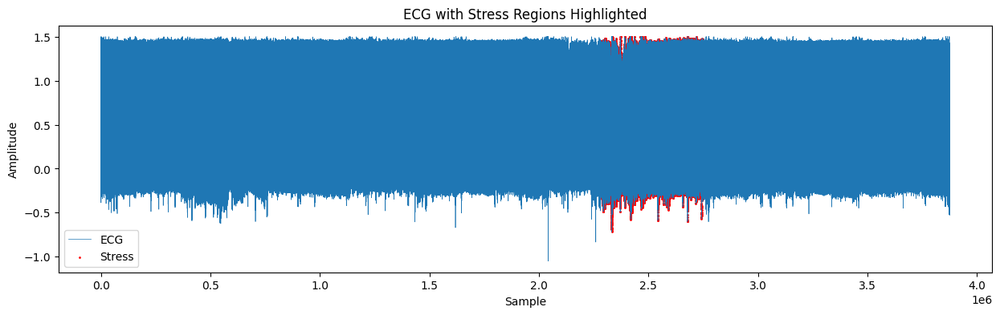

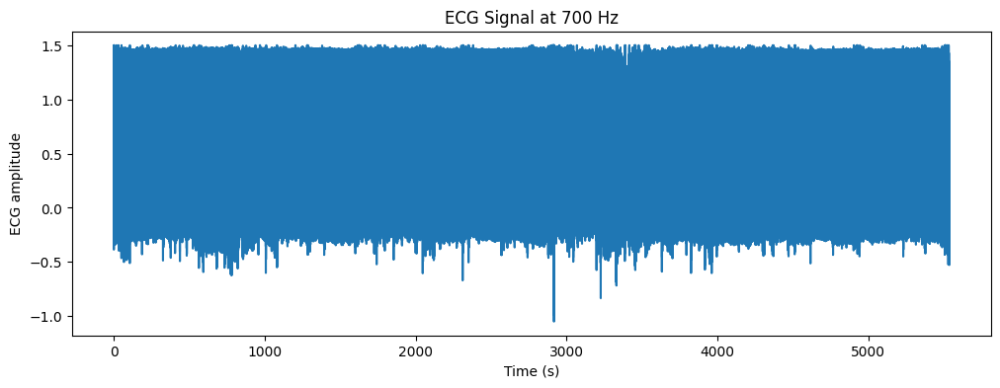

Patient: S14.pkl
Samples No Stress: 3411100
Samples Stress: 472500


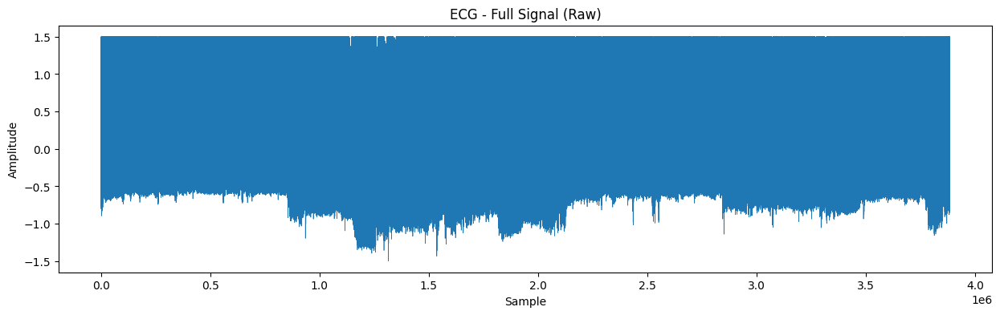

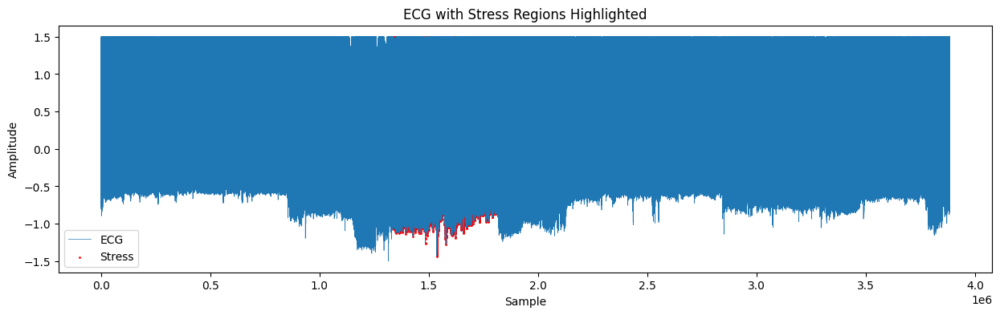

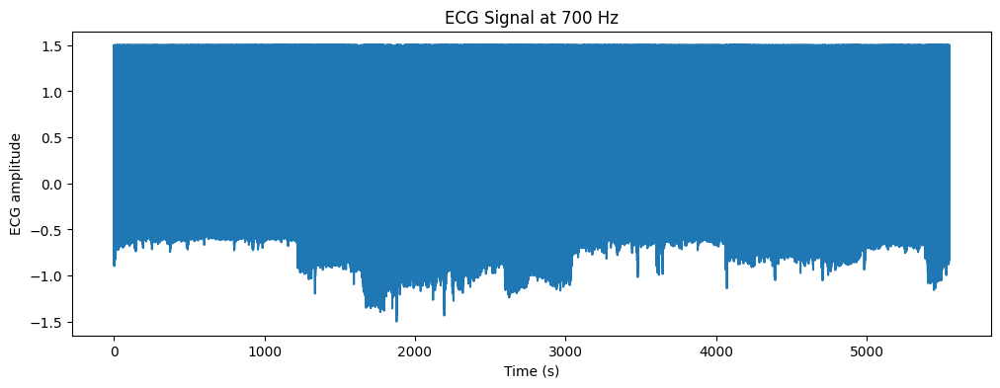

Patient: S15.pkl
Samples No Stress: 3196200
Samples Stress: 480200


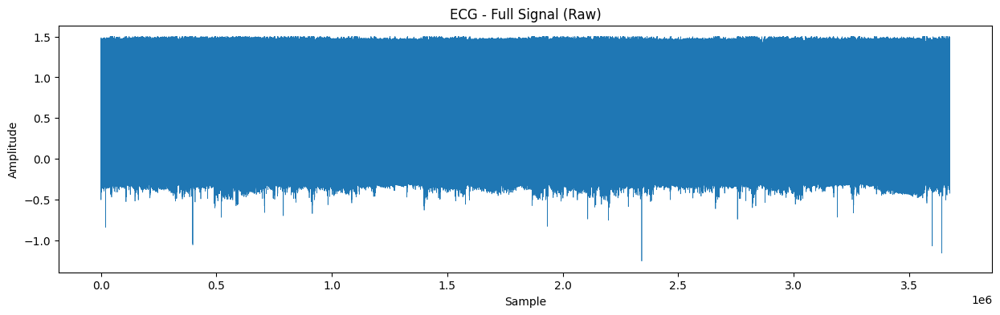

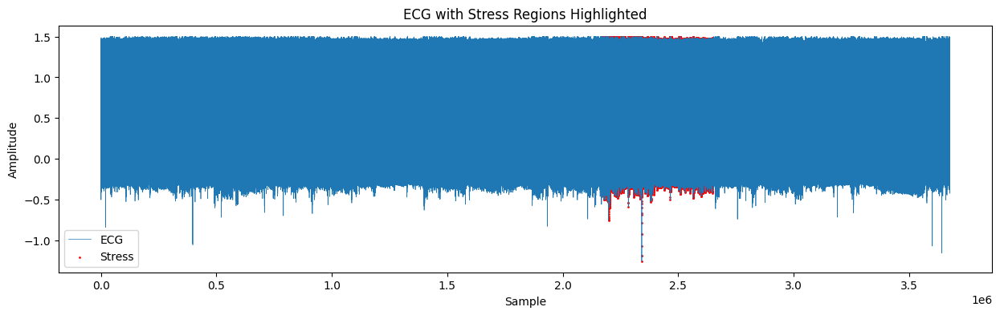

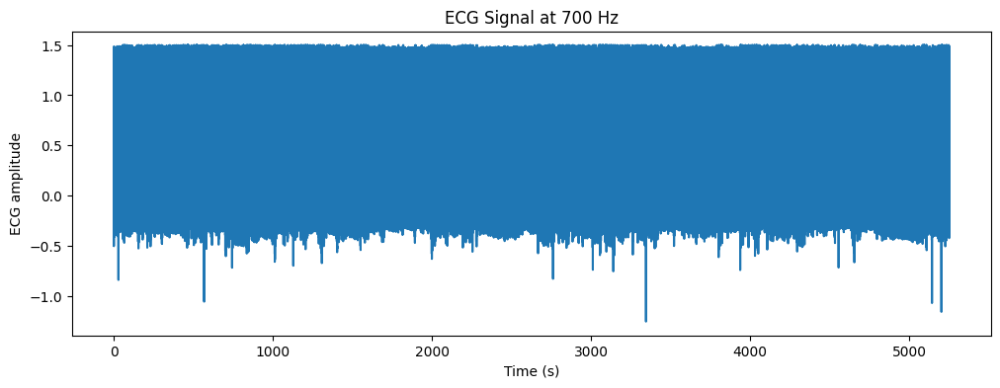

Patient: S16.pkl
Samples No Stress: 3470599
Samples Stress: 471101


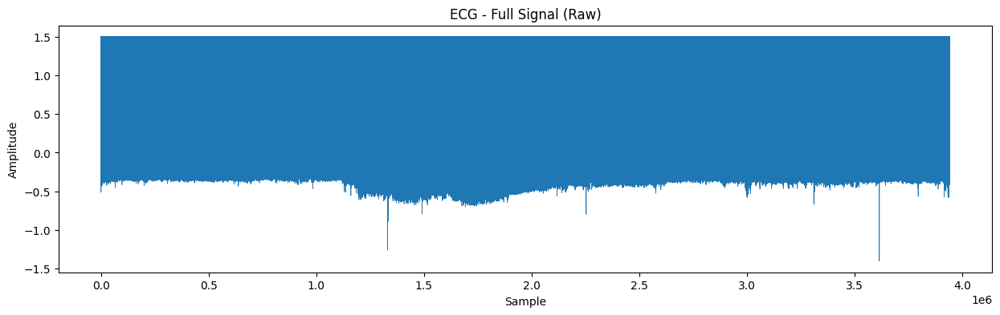

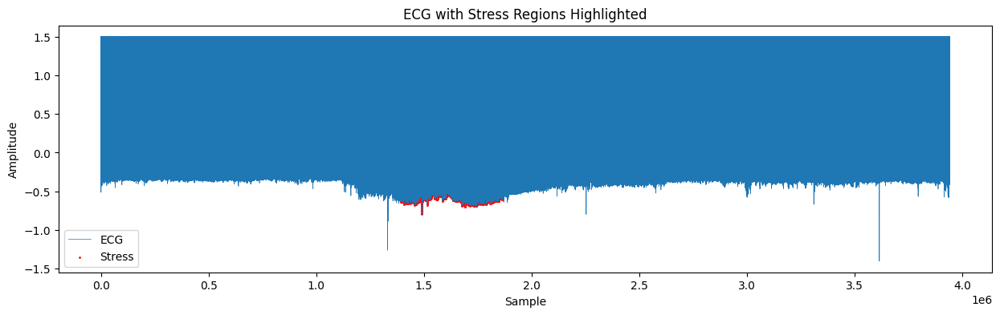

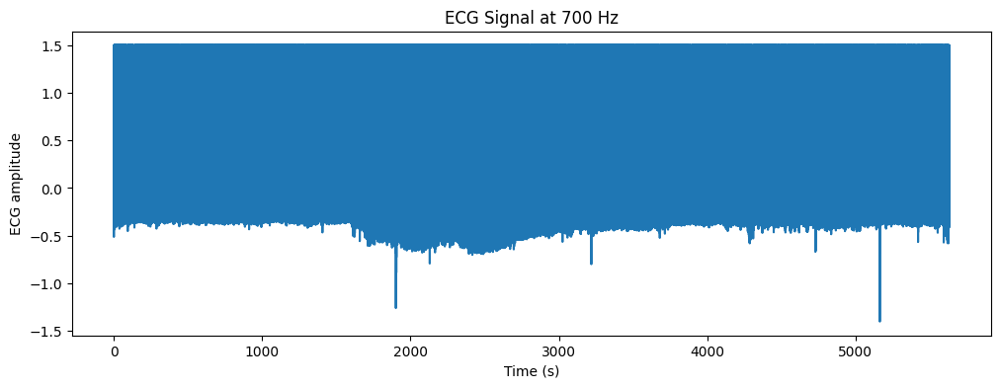

Patient: S17.pkl
Samples No Stress: 3637900
Samples Stress: 506100


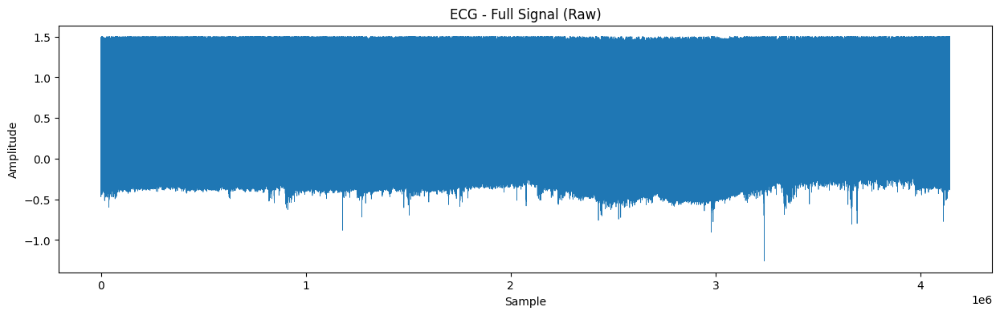

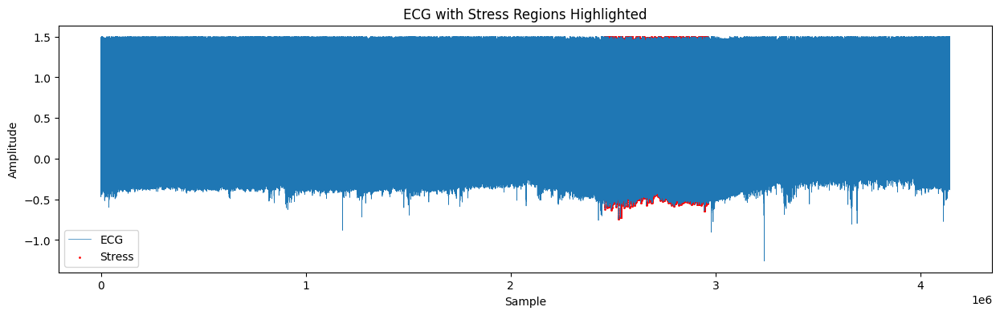

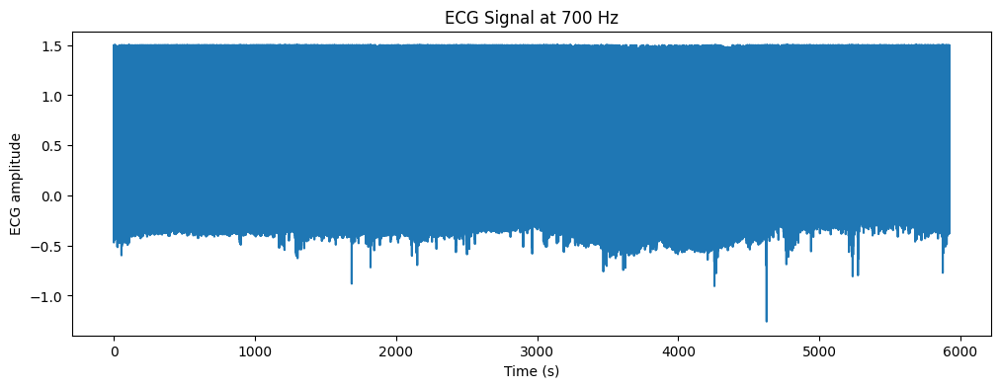

In [6]:
def analyze_ecg(patient_file, fs=700, plot_full=True, plot_highlight=True, plot_time=True):

    
    # 1. Load data
    with open(patient_file, "rb") as f:
        data = pickle.load(f, encoding="latin1")
    
    ecg = data["signal"]["chest"]["ECG"].flatten()  # flatten in case it's (N,1)
    labels = data["label"]
    
    # 2. Convert labels → binary (0 = no stress, 1 = stress)
    binary_labels = np.zeros_like(labels)
    binary_labels[labels == 2] = 1   # Stress

    # 3. Extract ECG segments by class
    ecg_no_stress = ecg[binary_labels == 0]
    ecg_stress = ecg[binary_labels == 1]

    print(f"Patient: {patient_file.split('/')[-1]}")
    print("Samples No Stress:", len(ecg_no_stress))
    print("Samples Stress:", len(ecg_stress))
    
    # 4. Plot full ECG signal
    if plot_full:
        plt.figure(figsize=(15,4))
        plt.plot(ecg, linewidth=0.5)
        plt.title("ECG - Full Signal (Raw)")
        plt.xlabel("Sample")
        plt.ylabel("Amplitude")
        plt.show()

    # 5. Plot ECG with stress segments highlighted
    if plot_highlight:
        plt.figure(figsize=(15,4))
        plt.plot(ecg, label="ECG", linewidth=0.5)
        stress_idx = np.where(binary_labels == 1)[0]
        plt.scatter(stress_idx, ecg[stress_idx], s=1, color="red", label="Stress")
        plt.title("ECG with Stress Regions Highlighted")
        plt.xlabel("Sample")
        plt.ylabel("Amplitude")
        plt.legend()
        plt.show()

    # 6. Plot ECG with time axis
    if plot_time:
        N = len(ecg)
        time = np.arange(N) / fs  # in seconds
        plt.figure(figsize=(12,4))
        plt.plot(time, ecg)
        plt.xlabel("Time (s)")
        plt.ylabel("ECG amplitude")
        plt.title(f"ECG Signal at {fs} Hz")
        plt.show()
    
    return ecg, binary_labels, ecg_no_stress, ecg_stress



for pf in patient_files:
    analyze_ecg(pf)


# Signal Cleaning

## 📌 ECG Preprocessing: Standardization and Bandpass Filtering

In this step, we preprocess the ECG signals to remove noise and retain only the frequency components that are relevant for stress analysis.

---


#### **1. Sampling Frequency Definition**
The ECG sampling frequency is set to **700 Hz** and is used for:
- Bandpass filtering
- Construction of the time axis for visualization

#### **2. Bandpass Filter Design**
A **Butterworth bandpass filter** is defined with:
- **Low cutoff frequency:** 0.5 Hz  
- **High cutoff frequency:** 40 Hz  

This frequency range preserves the main ECG components while removing:
- Baseline drift (low-frequency noise)
- High-frequency noise

#### **3. Zero-phase Filtering**
The `filtfilt` function is used to apply the filter **forward and backward**, ensuring:
- No phase distortion
- Preservation of the original ECG waveform shape

#### **4. ECG Loading and Label Processing**
For each patient file:
- The ECG signal is loaded and flattened into a 1D array
- Stress labels are converted into a **binary format**:
  - `0` → no stress  
  - `1` → stress  

#### **5. Signal Standardization**
The ECG signal is standardized to have:
- **Zero mean**
- **Unit variance**

This step normalizes amplitude differences between patients and improves model stability.

#### **6. ECG Filtering**
The standardized ECG signal is passed through the bandpass filter, producing a **cleaned ECG signal** suitable for further analysis.

#### **7. Preprocessing Visualization (Optional)**
When enabled, a plot compares:
- The **standardized ECG**
- The **filtered ECG** over time  

This visualization helps to qualitatively assess the effect of preprocessing.

#### **8. Batch Preprocessing**
The preprocessing function is applied to **all patient files**.
- Cleaned ECG signals
- Corresponding binary stress labels  

are stored in dictionaries for **later feature extraction and modeling**.


In [7]:
fs = 700  # Hz

def bandpass_filter(signal, lowcut=0.5, highcut=40, fs=700, order=4):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    filtered = filtfilt(b, a, signal)
    return filtered

def preprocess_ecg(patient_file, plot=True):

    # 1. Load ECG
    with open(patient_file, "rb") as f:
        data = pickle.load(f, encoding="latin1")
    
    ecg = data["signal"]["chest"]["ECG"].flatten()
    labels = data["label"]
    
    # Convert labels to binary
    binary_labels = np.zeros_like(labels)
    binary_labels[labels == 2] = 1
    
    # Standardizzazione
    ecg_std = (ecg - np.mean(ecg)) / np.std(ecg)
    
    # Bandpass filter
    ecg_filtered = bandpass_filter(ecg_std, fs=fs)
    
    # Plot 
    if plot:
        time = np.arange(len(ecg)) / fs
        plt.figure(figsize=(15,4))
        plt.plot(time, ecg_std, label="Standardized ECG", alpha=0.5)
        plt.plot(time, ecg_filtered, label="Filtered ECG", linewidth=1)
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.title(f"ECG Preprocessing - {patient_file.split('/')[-1]}")
        plt.legend()
        plt.show()
    
    return ecg_filtered, binary_labels



all_ecg_cleaned = {}
all_labels = {}

for pf in patient_files:
    ecg_clean, labels = preprocess_ecg(pf, plot=False)  # plot=True if you want to visualize
    all_ecg_cleaned[pf] = ecg_clean
    all_labels[pf] = labels


# Segmentation

## 📌 ECG Segmentation Using Sliding Windows

In this step, the preprocessed ECG signals are divided into fixed-length time windows to prepare the data for feature extraction and stress classification.

---


#### **1. Window Parameters Definition**
Each ECG signal is segmented using:
- A **window length of 10 seconds** (7000 samples at 700 Hz)
- A **50% overlap** between consecutive windows  

This strategy increases the number of training samples while preserving temporal continuity.

#### **2. Data Structures Initialization**
Two dictionaries are initialized to store:
- ECG segments for each patient
- The corresponding stress labels for each segment

#### **3. Sliding Window Segmentation**
For each patient:
- A sliding window moves along the **filtered ECG signal**
- At each step, a fixed-size ECG segment is extracted

#### **4. Window-level Label Assignment**
Each ECG window contains multiple **sample-level labels**.
A **majority vote rule** is applied:
- The window is labeled as **stress (1)** if more than half of its samples indicate stress
- Otherwise, it is labeled as **no stress (0)**

#### **5. Conversion to NumPy Arrays**
The extracted ECG windows and their labels are converted into **NumPy arrays** to ensure efficient processing and compatibility with machine learning pipelines.

#### **6. Patient-wise Storage**
ECG segments and their labels are stored in dictionaries using the **patient file as key**, enabling subject-level data organization and analysis.

#### **7. Dataset Inspection**
For each patient:
- The total number of extracted windows is printed
- The label distribution is displayed  

This helps verify the **class balance** and correctness of the segmentation process.

---

This segmentation step transforms the continuous ECG signal into **labeled time windows**, making the data suitable for subsequent **feature extraction and machine learning models**.


In [8]:
window_size = 7000   # 10 seconds
step_size = 3500     # 50% overlap

# Dictionaries to save windows and labels for each patient
segments_per_patient = {}
labels_per_patient = {}

for pf in all_ecg_cleaned.keys():
    ecg_filtered = all_ecg_cleaned[pf]
    binary_labels = all_labels[pf]
    
    ecg_segments = []
    label_segments = []
    
    for start in range(0, len(ecg_filtered) - window_size + 1, step_size):
        end = start + window_size
        ecg_win = ecg_filtered[start:end]
        labels_win = binary_labels[start:end]
        
        # Label of the window: majority vote
        window_label = 1 if np.sum(labels_win) > len(labels_win)/2 else 0
        
        ecg_segments.append(ecg_win)
        label_segments.append(window_label)
    
    ecg_segments = np.array(ecg_segments)
    label_segments = np.array(label_segments)
    
    # Save to dictionaries
    segments_per_patient[pf] = ecg_segments
    labels_per_patient[pf] = label_segments
    
    print(f"Paziente {pf.split('/')[-1]} - Numero finestre: {len(ecg_segments)}, Distribuzione label: {np.bincount(label_segments)}")




Paziente S2.pkl - Numero finestre: 1214, Distribuzione label: [1091  123]
Paziente S3.pkl - Numero finestre: 1297, Distribuzione label: [1169  128]
Paziente S4.pkl - Numero finestre: 1283, Distribuzione label: [1156  127]
Paziente S5.pkl - Numero finestre: 1250, Distribuzione label: [1121  129]
Paziente S6.pkl - Numero finestre: 1413, Distribuzione label: [1283  130]
Paziente S7.pkl - Numero finestre: 1046, Distribuzione label: [918 128]
Paziente S8.pkl - Numero finestre: 1092, Distribuzione label: [958 134]
Paziente S9.pkl - Numero finestre: 1043, Distribuzione label: [914 129]
Paziente S10.pkl - Numero finestre: 1098, Distribuzione label: [953 145]
Paziente S11.pkl - Numero finestre: 1045, Distribuzione label: [909 136]
Paziente S13.pkl - Numero finestre: 1106, Distribuzione label: [974 132]
Paziente S14.pkl - Numero finestre: 1108, Distribuzione label: [973 135]
Paziente S15.pkl - Numero finestre: 1049, Distribuzione label: [911 138]
Paziente S16.pkl - Numero finestre: 1125, Distrib

# Feature Extraction

## 📌 Feature Extraction from ECG Windows (Time, Frequency, and HRV Domains)

In this step, we define functions to extract meaningful features from each ECG window.  
These features summarize the ECG signal and are used as input for stress classification models.

---


#### **1. Time-domain Features**
For each ECG window, basic statistical and signal-shape features are computed:
- **Mean**, **standard deviation**, **RMS**, and **peak-to-peak amplitude**
- **Zero-crossing rate**, which reflects signal variability
- **Signal energy**
- **Hjorth parameters** (*activity, mobility, complexity*), which describe signal dynamics  

These features capture the overall amplitude and temporal behavior of the ECG signal.

#### **2. Frequency-domain Features**
The **Power Spectral Density (PSD)** is estimated using the **Welch method**.  
From the PSD, spectral power is computed in two important frequency bands:
- **LF (Low Frequency):** 0.04–0.15 Hz
- **HF (High Frequency):** 0.15–0.40 Hz  

The **LF/HF ratio** is also calculated, as it is commonly used as an indicator of **autonomic nervous system balance**.

#### **3. Heart Rate Variability (HRV) Features**
R-peaks are detected using the **neurokit2** library.  
From the **R–R intervals (RRI)**, the following HRV features are extracted:
- **SDNN** (standard deviation of R–R intervals)
- **RMSSD** (root mean square of successive differences)
- **pNN50** (percentage of successive RR differences greater than 50 ms)
- **Mean heart rate**

If too few R-peaks are detected, the function returns **NaN values** to handle unreliable ECG windows.

#### **4. Feature Output**
Each feature extraction function returns a **list of numerical values** that compactly represent a single ECG window.

---

This feature extraction step transforms raw ECG segments into **structured numerical representations**, enabling machine learning models to effectively distinguish between **stress** and **no-stress** conditions.


In [9]:
def time_domain_features(ecg_win):
    x = ecg_win
    # Base statistics
    mean = np.mean(x)
    std = np.std(x)
    rms = np.sqrt(np.mean(x**2))
    ptp = np.ptp(x)
    # Zero-crossing rate
    zcr = ((x[:-1] * x[1:]) < 0).sum() / len(x)
    # Energy
    energy = np.sum(x**2)
    # Hjorth
    dx = np.diff(x)
    ddx = np.diff(dx)
    activity = np.var(x)
    mobility = np.sqrt(np.var(dx) / activity)
    complexity = np.sqrt(np.var(ddx)/np.var(dx)) / mobility
    return [mean, std, rms, ptp, zcr, energy, activity, mobility, complexity]

    
def freq_domain_features(ecg_win, fs=700):
    f, Pxx = welch(ecg_win, fs=fs, nperseg=1024)
    # LF power
    lf_band = (f >= 0.04) & (f < 0.15)
    hf_band = (f >= 0.15) & (f <= 0.40)
    lf_power = np.trapz(Pxx[lf_band], f[lf_band])
    hf_power = np.trapz(Pxx[hf_band], f[hf_band])
    lf_hf_ratio = lf_power / hf_power if hf_power > 0 else 0
    return [lf_power, hf_power, lf_hf_ratio]


def hrv_features(ecg_win, fs=700):
    _, rpeaks = nk.ecg_peaks(ecg_win, sampling_rate=fs)
    rri = np.diff(rpeaks['ECG_R_Peaks']) / fs

    if len(rri) < 2:
        return [np.nan]*4  # now we have 4 HRV features

    sdnn = np.std(rri)
    rmssd = np.sqrt(np.mean(np.diff(rri)**2))
    pnn50 = np.sum(np.diff(rri) > 0.05) / len(rri)
    hr_mean = 60 / np.mean(rri)

    return [sdnn, rmssd, pnn50, hr_mean]


## 📌 Extracting Features from All ECG Windows

In this step, we compute and store features for each ECG window of every patient, combining time-domain, frequency-domain, and HRV features.

---


#### **1. Data Structures Initialization**
Two dictionaries are created to store:
- `features_per_patient`: numerical features for each window  
- `labels_per_patient_features`: corresponding stress labels  

#### **2. Loop Over Patients**
For each patient, we retrieve:
- Pre-segmented ECG windows  
- Window-level stress labels  

#### **3. Feature Extraction Per Window**
For every ECG window:
- Time-domain features are computed using `time_domain_features`
- Frequency-domain features are computed using `freq_domain_features`
- HRV features are computed using `hrv_features`

All extracted features are concatenated into a single **feature vector** for each window.

#### **4. Patient-level Storage**
- Feature vectors for all windows are converted into a **NumPy array**
- Saved in the dictionary under the patient key  
- Corresponding labels are saved in a separate dictionary

#### **5. Summary Printing**
For each patient:
- The number of windows is printed  
- The shape of features per window is displayed  

This helps verify the consistency and correctness of the extracted data.

---

This step transforms all segmented ECG windows into structured **feature vectors**, ready for machine learning models to classify **stress vs. no-stress**.


In [10]:
fs = 700

# Dictionaries to hold features and labels per patient
features_per_patient = {}
labels_per_patient_features = {}

for pf in segments_per_patient.keys():
    ecg_windows = segments_per_patient[pf]
    labels_windows = labels_per_patient[pf]
    
    patient_features = []
    
    for ecg_win in ecg_windows:
        # Time-domain
        time_features = time_domain_features(ecg_win)
        # Frequency-domain
        freq_features = freq_domain_features(ecg_win, fs=fs)
        # HRV
        hrv_feats = hrv_features(ecg_win, fs=fs)
        # Concateno tutte le features
        feats = np.array(time_features + freq_features + hrv_feats)
        patient_features.append(feats)
    
    features_per_patient[pf] = np.array(patient_features)
    labels_per_patient_features[pf] = labels_windows

    print(f"Patient {pf.split('/')[-1]} - Windows: {len(patient_features)}, Shape features per window: {patient_features[0].shape}")


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S2.pkl - Windows: 1214, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S3.pkl - Windows: 1297, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S4.pkl - Windows: 1283, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S5.pkl - Windows: 1250, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S6.pkl - Windows: 1413, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S7.pkl - Windows: 1046, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S8.pkl - Windows: 1092, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S9.pkl - Windows: 1043, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S10.pkl - Windows: 1098, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S11.pkl - Windows: 1045, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S13.pkl - Windows: 1106, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S14.pkl - Windows: 1108, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S15.pkl - Windows: 1049, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S16.pkl - Windows: 1125, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

Patient S17.pkl - Windows: 1183, Shape features per window: (16,)


C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lf_power = np.trapz(Pxx[lf_band], f[lf_band])
C:\Users\fccat\AppData\Local\Temp\ipykernel_13260\3073743351.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  hf_power = np.trapz(Pxx[hf_band], f[hf

In [11]:
features_per_patient

{'C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S2.pkl': array([[ 1.31403851e-03,  9.35303994e-01,  9.35304917e-01, ...,
          5.91627142e-02,  1.00000000e-01,  7.23638870e+01],
        [-8.16550707e-03,  9.32249293e-01,  9.32285053e-01, ...,
          4.78352236e-02,  2.00000000e-01,  6.90789474e+01],
        [ 1.18936480e-02,  9.27407369e-01,  9.27483631e-01, ...,
          5.09590561e-02,  1.00000000e-01,  7.36971398e+01],
        ...,
        [-8.02965311e-03,  8.98023116e-01,  8.98059014e-01, ...,
          3.25948224e-01,  2.72727273e-01,  7.57004752e+01],
        [ 6.64336913e-03,  9.12371408e-01,  9.12395594e-01, ...,
          2.70617963e-01,  3.63636364e-01,  7.98203179e+01],
        [ 1.41475517e-03,  8.51537731e-01,  8.51538906e-01, ...,
          4.21821850e-02,  2.22222222e-01,  6.04219949e+01]],
       shape=(1214, 16)),
 'C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/P

In [12]:
labels_per_patient_features

{'C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S2.pkl': array([0, 0, 0, ..., 0, 0, 0], shape=(1214,)),
 'C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S3.pkl': array([0, 0, 0, ..., 0, 0, 0], shape=(1297,)),
 'C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S4.pkl': array([0, 0, 0, ..., 0, 0, 0], shape=(1283,)),
 'C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S5.pkl': array([0, 0, 0, ..., 0, 0, 0], shape=(1250,)),
 'C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S6.pkl': array([0, 0, 0, ..., 0, 0, 0], shape=(1413,)),
 'C:/Users/fccat/Documents/Universita/DATA SCIENCE/Digital Signal and Image Management/Project/ECG/ECG data/S7.pkl': array([0, 0, 0, ..., 0, 0, 0], shape=(1046,)),
 'C:/Users/fccat

# Train and Test split

## 📌 Train-Test Split by Patient (Subject-wise Split)

In this step, we split the dataset into training and testing sets using a subject-wise approach.

---


#### **1. List of All Patients**
We create a list of all patient identifiers based on the keys of the `features_per_patient` dictionary.

#### **2. Subject-wise Splitting**
- The **first 12 patients** are used for training  
- The **remaining patients** are used for testing  

This ensures that **no patient appears in both sets**, avoiding data leakage and providing a realistic evaluation of the model.

#### **3. Print the Split**
The names of the training and testing patients are printed for:
- transparency
- reproducibility

---

This type of split is important in biomedical data because it ensures the model is evaluated on **completely unseen subjects**, which better reflects real-world performance.


In [13]:
all_patients = list(features_per_patient.keys())

train_patients = all_patients[:12]
test_patients = all_patients[12:]

print("Train:", [p.split('/')[-1] for p in train_patients])
print("Test:", [p.split('/')[-1] for p in test_patients])


Train: ['S2.pkl', 'S3.pkl', 'S4.pkl', 'S5.pkl', 'S6.pkl', 'S7.pkl', 'S8.pkl', 'S9.pkl', 'S10.pkl', 'S11.pkl', 'S13.pkl', 'S14.pkl']
Test: ['S15.pkl', 'S16.pkl', 'S17.pkl']


## 📌 Creating Train and Test Sets (Concatenation of Patient Data)

In this step, we combine the feature windows and labels from multiple patients to create the final training and testing datasets.

---


#### **1. Concatenate Training Data**
For all patients in the training group:
- Feature vectors from each window are concatenated into a single array (`X_train`)
- Corresponding window labels are concatenated into a single array (`y_train`)

#### **2. Concatenate Testing Data**
The same process is applied to the patients in the testing group to build:
- `X_test`
- `y_test`

#### **3. Dataset Shape Verification**
The shapes of the training and testing sets are printed to confirm:
- the number of windows
- the number of features

#### **4. Class Distribution Check**
The distribution of stress vs no-stress labels is printed for both:
- training set
- testing set

This helps to understand class imbalance and guide potential strategies (e.g., balancing or weighting).

---

After this step, the data are ready for **model training and evaluation**.


In [14]:
# Train
X_train = np.concatenate([features_per_patient[p] for p in train_patients], axis=0)
y_train = np.concatenate([labels_per_patient_features[p] for p in train_patients], axis=0)

# Test
X_test = np.concatenate([features_per_patient[p] for p in test_patients], axis=0)
y_test = np.concatenate([labels_per_patient_features[p] for p in test_patients], axis=0)

print("Train shape:", X_train.shape, y_train.shape)
print("Test shape:", X_test.shape, y_test.shape)
print("Train Distribution:", np.bincount(y_train))
print("Test Distribution:", np.bincount(y_test))

Train shape: (13995, 16) (13995,)
Test shape: (3357, 16) (3357,)
Train Distribution: [12419  1576]
Test Distribution: [2939  418]


## 📌 Feature Standardization (Z-score Normalization)

In this step, we standardize the feature values to improve the performance of the machine learning models.

---


#### **1. StandardScaler Initialization**
We use `StandardScaler` from scikit-learn, which performs **Z-score normalization**.

#### **2. Fit and Transform on Training Data**
The scaler is fitted on the training set (`X_train`) and then applied to transform it.  
This ensures that the training features have:
- **mean ≈ 0**
- **standard deviation ≈ 1**

#### **3. Transform on Test Data**
The same scaling parameters (mean and standard deviation from the training set) are applied to the test set (`X_test`).  
This avoids **data leakage** and keeps the test data consistent with the training distribution.

---

After standardization, the feature values are more comparable and model training becomes more stable.


In [15]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Classification

## 📌 Model Training and Evaluation with SMOTE + SVC (Grid Search)

In this step, we handle class imbalance using SMOTE, then train and evaluate a Support Vector Classifier (SVC) with hyperparameter tuning.

---


#### **1. SMOTE Oversampling**
The training data is imbalanced (more no-stress than stress samples).  
SMOTE creates synthetic samples for the minority class to balance the dataset:

- `X_res`, `y_res` are the resampled training features and labels  
- The new class distribution is printed for verification  

#### **2. SVC Model Definition**
A Support Vector Classifier (SVC) is defined with `class_weight='balanced'` to further handle imbalance during training.

#### **3. Hyperparameter Grid Definition**
A grid of parameters is created for tuning:
- `kernel`: RBF or linear  
- `C`: regularization strength (`0.1`, `1`, `10`)  
- `gamma`: kernel coefficient (`'scale'` or `'auto'`)

#### **4. GridSearchCV Setup**
`GridSearchCV` performs exhaustive search over the parameter grid using:
- **5-fold cross-validation**
- **f1_macro scoring** to balance evaluation across classes
- **parallel processing** (`n_jobs=-1`)

#### **5. Training the Model**
GridSearch is fitted on the resampled training data (`X_res`, `y_res`).  
The best parameters and the best cross-validation F1 score are printed.

#### **6. Testing and Evaluation**
The best SVC model is used to predict the test set (`X_test_scaled`).  
A classification report is printed, showing:
- precision
- recall
- F1-score  
for each class.

---

This step completes the machine learning pipeline and provides a performance summary for the stress detection model.


In [16]:
# SMOTE puro
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train_scaled, y_train)

print("Classes distribution after SMOTE:", np.bincount(y_res))


svc = SVC(class_weight='balanced', random_state=42)

# parameters grid to test
param_grid = {
    'kernel': ['rbf', 'linear'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto']
}

grid_search = GridSearchCV(
    estimator=svc,
    param_grid=param_grid,
    scoring='f1_macro',    # macro f1 for imbalanced classes
    cv=5,
    n_jobs=-1,
    verbose=2
)


grid_search.fit(X_res, y_res)

print("Best parameters found:", grid_search.best_params_)
print("Best cross-validation F1 score:", grid_search.best_score_)

# Prediction and evaluation
best_svc = grid_search.best_estimator_
y_pred = best_svc.predict(X_test_scaled)

print("Classification Report SMOTE + GridSearchCV SVC:\n")
print(classification_report(y_test, y_pred))


Classes distribution after SMOTE: [12419 12419]
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters found: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best cross-validation F1 score: 0.8208902389639059
Classification Report SMOTE + GridSearchCV SVC:

              precision    recall  f1-score   support

           0       0.94      0.83      0.88      2939
           1       0.35      0.66      0.46       418

    accuracy                           0.81      3357
   macro avg       0.65      0.74      0.67      3357
weighted avg       0.87      0.81      0.83      3357



## 📌 Model Training with Different Undersampling Techniques + SVC

In this step, we test multiple undersampling methods to handle class imbalance, and we train an SVC model using GridSearchCV for each method.

---


#### **1. Define Undersampling Methods**
Four different undersampling techniques are used:

- **RandomUnderSampler**: randomly removes samples from the majority class  
- **NearMiss (versions 1, 2, 3)**: selects majority samples that are closest to minority samples  

Each method produces a balanced dataset in a different way.

#### **2. Hyperparameter Grid Definition**
The same SVC parameter grid is used as before:

- `kernel`: rbf or linear  
- `C`: 0.1, 1, 10  
- `gamma`: scale or auto  

#### **3. Loop Over Undersampling Methods**
For each sampler:

- The training data is resampled  
- The class distribution after resampling is printed  

#### **4. SVC + GridSearchCV**
For each resampled dataset:

- An SVC model is trained using GridSearchCV  
- **5-fold cross-validation** and **f1_macro scoring** are used  
- The best parameters and best cross-validation score are printed  

#### **5. Testing and Evaluation**
The best model from each undersampling method is used to predict the test set.  
A classification report is printed for each method to compare performance.

---

This step allows comparing how different balancing strategies affect stress detection performance and helps choose the best approach.


In [17]:

undersamplers = {
    "RandomUnderSampler": RandomUnderSampler(random_state=42),
    "NearMiss_v1": NearMiss(version=1),
    "NearMiss_v2": NearMiss(version=2),
    "NearMiss_v3": NearMiss(version=3)
}

# Parameters grid to test
param_grid = {
    'kernel': ['rbf', 'linear'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto']
}

for name, sampler in undersamplers.items():
    X_res, y_res = sampler.fit_resample(X_train_scaled, y_train)
    print(f"\n{name} - Classes distribution:", np.bincount(y_res))
    
    # SVC + GridSearchCV
    svc = SVC(class_weight='balanced', random_state=42)
    
    grid_search = GridSearchCV(
        estimator=svc,
        param_grid=param_grid,
        scoring='f1_macro',
        cv=5,
        n_jobs=-1,
        verbose=2
    )
    
    grid_search.fit(X_res, y_res)
    
    print(f"\n{name} - Best parameters:", grid_search.best_params_)
    print(f"{name} - Best cross-validation F1 score:", grid_search.best_score_)
    
    # Prediction and evaluation
    best_svc = grid_search.best_estimator_
    y_pred = best_svc.predict(X_test_scaled)
    
    print(f"\nClassification Report {name}:\n")
    print(classification_report(y_test, y_pred))



RandomUnderSampler - Classes distribution: [1576 1576]
Fitting 5 folds for each of 12 candidates, totalling 60 fits

RandomUnderSampler - Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
RandomUnderSampler - Best cross-validation F1 score: 0.7365452676643982

Classification Report RandomUnderSampler:

              precision    recall  f1-score   support

           0       0.99      0.69      0.82      2939
           1       0.31      0.97      0.47       418

    accuracy                           0.73      3357
   macro avg       0.65      0.83      0.64      3357
weighted avg       0.91      0.73      0.77      3357


NearMiss_v1 - Classes distribution: [1576 1576]
Fitting 5 folds for each of 12 candidates, totalling 60 fits

NearMiss_v1 - Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
NearMiss_v1 - Best cross-validation F1 score: 0.6672262577562936

Classification Report NearMiss_v1:

              precision    recall  f1-score   support

      

## 📌 Baseline Model: SVC with Grid Search on Original (Unbalanced) Data

In this step, we train a baseline SVC model using the original (unbalanced) training set.  
This baseline helps us compare the effect of sampling strategies (SMOTE or undersampling).

---


#### **1. SVC Model Definition**
A Support Vector Classifier (SVC) is created with `class_weight='balanced'` to partially address class imbalance.

#### **2. Hyperparameter Grid Definition**
We test different SVC configurations using the same grid:

- `kernel`: rbf or linear  
- `C`: 0.1, 1, 10  
- `gamma`: scale or auto  

#### **3. GridSearchCV Setup**
GridSearchCV is configured to:

- run **5-fold cross-validation**
- optimize **macro F1 score** (to balance the two classes)
- run in parallel (`n_jobs=-1`)

#### **4. Training on Original Data**
Grid search is fitted on the original training set **without any oversampling or undersampling**.

#### **5. Best Model Selection**
The best hyperparameters and the best cross-validation F1 score are printed.

#### **6. Evaluation on Test Set**
The best SVC model is used to predict the test set.  
A classification report is printed to evaluate performance.

#### **7. Class Distribution Check**
The label distribution in the training and test sets is printed to show the imbalance problem.

---

This baseline model provides a reference point to understand whether sampling methods improve the stress detection results.


In [18]:
svc = SVC(class_weight='balanced', random_state=42)

# Parameters grid to test
param_grid = {
    'kernel': ['rbf', 'linear'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto']
}

grid_search = GridSearchCV(
    estimator=svc,
    param_grid=param_grid,
    scoring='f1_macro',  
    cv=5,
    n_jobs=-1,
    verbose=2
)


grid_search.fit(X_train_scaled, y_train)

print("Best parameters found:", grid_search.best_params_)
print("Best cross-validation F1 score:", grid_search.best_score_)

#Prediction and evaluation
best_svc = grid_search.best_estimator_
y_pred = best_svc.predict(X_test_scaled)

print("Classification Report SVC + GridSearchCV:\n")
print(classification_report(y_test, y_pred))

# -----------------------------
# Classes distribution
# -----------------------------
print("Train Classes Distribution:", np.bincount(y_train))
print("Test Classes Distribution:", np.bincount(y_test))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters found: {'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}
Best cross-validation F1 score: 0.6099458508810428
Classification Report SVC + GridSearchCV:

              precision    recall  f1-score   support

           0       0.98      0.76      0.86      2939
           1       0.35      0.88      0.50       418

    accuracy                           0.78      3357
   macro avg       0.66      0.82      0.68      3357
weighted avg       0.90      0.78      0.81      3357

Train Classes Distribution: [12419  1576]
Test Classes Distribution: [2939  418]


## 📌 Ensemble Learning: Bagging with SVC + Hyperparameter Tuning

In this step, we build an ensemble model using Bagging (Bootstrap Aggregating) combined with SVC.  
Bagging helps reduce variance and improves generalization, especially on noisy data like ECG.

---


#### **1. Base SVC Definition**
A basic Support Vector Classifier (`svc_base`) is created with `class_weight='balanced'`.

#### **2. Parameter Grid for GridSearch**
Because the SVC is wrapped inside a `BaggingClassifier`, parameters must be referenced using the `estimator__` prefix:

- `estimator__kernel`: rbf or linear  
- `estimator__C`: 0.1, 1, 10  
- `estimator__gamma`: scale or auto  

#### **3. Bagging Model Setup**
A `BaggingClassifier` is defined with:
- **10 base estimators** (`n_estimators=10`)
- each estimator trained on **80% of the data** (`max_samples=0.8`)
- **bootstrap sampling enabled**
- **parallel execution** (`n_jobs=-1`)

#### **4. GridSearchCV Setup**
`GridSearchCV` is used to tune the SVC parameters inside the bagging ensemble, optimizing:
- **macro F1 score**
- **5-fold cross-validation**

#### **5. Training the Ensemble**
The model is trained on the original training set (`X_train_scaled`, `y_train`).

#### **6. Best Model Selection**
The best parameters and the best cross-validation score are printed.

#### **7. Testing and Evaluation**
The best bagging model is used to predict the test set and a classification report is printed.

#### **8. Class Distribution Check**
The class distribution is printed again to show the imbalance in the dataset.

---

This step tests whether an ensemble approach improves stress detection compared to a single SVC.


In [19]:
svc_base = SVC(class_weight='balanced', random_state=42)


param_grid = {
    'estimator__kernel': ['rbf', 'linear'],
    'estimator__C': [0.1, 1, 10],
    'estimator__gamma': ['scale', 'auto']
}


bagging_model = BaggingClassifier(
    estimator=svc_base,
    n_estimators=10,
    max_samples=0.8,
    bootstrap=True,
    n_jobs=-1,
    random_state=42
)

grid_search = GridSearchCV(
    estimator=bagging_model,
    param_grid=param_grid,
    scoring='f1_macro',
    cv=5,
    n_jobs=-1,
    verbose=2
)


grid_search.fit(X_train_scaled, y_train)

print("Best parameters found (Bagging + SVC):", grid_search.best_params_)
print("Best cross-validation F1 score:", grid_search.best_score_)


best_bagging = grid_search.best_estimator_
y_pred = best_bagging.predict(X_test_scaled)

print("Classification Report - Bagging + GridSearchCV SVC:\n")
print(classification_report(y_test, y_pred))


print("Train Classes Distribution:", np.bincount(y_train))
print("Test Classes Distribution:", np.bincount(y_test))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters found (Bagging + SVC): {'estimator__C': 1, 'estimator__gamma': 'auto', 'estimator__kernel': 'rbf'}
Best cross-validation F1 score: 0.6153801973244101
Classification Report - Bagging + GridSearchCV SVC:

              precision    recall  f1-score   support

           0       0.98      0.78      0.87      2939
           1       0.36      0.88      0.51       418

    accuracy                           0.79      3357
   macro avg       0.67      0.83      0.69      3357
weighted avg       0.90      0.79      0.82      3357

Train Classes Distribution: [12419  1576]
Test Classes Distribution: [2939  418]
